## Import function libraries

In [1]:
import numpy as np
import pandas as pd
import scipy
import scipy.stats as stats
import scipy.io as sio
import matplotlib.pyplot as plt
import nibabel as nib
from nilearn.plotting import view_img
import math
import os
from os.path import join, exists, split
from pathlib import Path
import sys
import time
import urllib.request
import copy
import warnings
from tqdm import tqdm
from pprint import pprint
from bids.layout import BIDSLayout
warnings.filterwarnings('ignore')

import glmsingle
from glmsingle.glmsingle import GLM_single

In [2]:
datadir = Path('/tank/shared/2023/dist_supp_pRF/pilot_data/')
datadir_bids = Path(datadir, 'bids_data')
datadir_fmriprep = Path(datadir, 'derivatives', 'fmriprep')
datadir_freesufer = Path(datadir, 'derivatives', 'freesurfer')
outputdir = Path(datadir, 'derivatives', 'GLMsingle_test', 'GLMsingle_2runs')
figuredir = Path(datadir, 'derivatives', 'GLMsingle_test', 'GLMsingle_2runs_figures')

print(f'directory of dataset:\n\t{datadir}\n')
print(f'directory to save example1 outputs:\n\t{outputdir}\n')

directory of dataset:
	/tank/shared/2023/dist_supp_pRF/pilot_data

directory to save example1 outputs:
	/tank/shared/2023/dist_supp_pRF/pilot_data/derivatives/GLMsingle_test/GLMsingle_2runs



In [3]:
sub = '001'
ses = '01'
runs = [4, 5]
angles = [*range(0, 360, 15)]
TR = 1.6 #s
pseudo_TR = 0.9
TR_nr = 346
blank_TR_nr = 4
fixation_dur = 0.4
stim_dur = 0.4
total_time = (TR_nr-blank_TR_nr)*TR

## Load files

In [4]:
bids_layout = BIDSLayout(datadir_bids, validate=False)
fmriprep_layout = BIDSLayout(datadir_fmriprep, validate=False)
ev_dfs = []
imgs = []

# event_file
# for run in fmriprep_layout.get_runs():
for run in runs:
    print("loading run {}".format(run))
    event_file = bids_layout.get(subject=sub, 
                                 session=ses, 
                                 task='ping', 
                                 run=run, 
                                 suffix="events",
                                 extension='tsv')[0]
    print("Event file path: ", event_file.path)
    ev_dfs.append(pd.read_csv(event_file.path, sep='\t'))
    
    # nifti file
    nifti_file = fmriprep_layout.get(subject=sub, 
                                 session=ses, 
                                 task='ping', 
                                 run=run, 
                                 space='T1w',
                                 suffix="bold",
                                 extension='nii.gz')[0]
    print("BOLD file path: ", nifti_file.path)
    datvol = nib.load(nifti_file)
    imgs.append(datvol.get_fdata())
    print(imgs[-1].shape)

# T1 file 
T1_file = fmriprep_layout.get(subject=sub, 
                                session=ses, 
                                suffix="T1w",
                                extension='nii.gz')[0]
print(T1_file.path)
T1vol = nib.load(T1_file)
    

loading run 4
Event file path:  /tank/shared/2023/dist_supp_pRF/pilot_data/bids_data/sub-001/ses-01/beh-bk/sub-001_ses-01_task-ping_run-04_events.tsv
BOLD file path:  /tank/shared/2023/dist_supp_pRF/pilot_data/derivatives/fmriprep/sub-001/ses-01/func/sub-001_ses-01_task-ping_run-4_space-T1w_desc-preproc_bold.nii.gz
(91, 106, 86, 608)
loading run 5
Event file path:  /tank/shared/2023/dist_supp_pRF/pilot_data/bids_data/sub-001/ses-01/beh-bk/sub-001_ses-01_task-ping_run-05_events.tsv
BOLD file path:  /tank/shared/2023/dist_supp_pRF/pilot_data/derivatives/fmriprep/sub-001/ses-01/func/sub-001_ses-01_task-ping_run-5_space-T1w_desc-preproc_bold.nii.gz
(91, 106, 86, 608)
/tank/shared/2023/dist_supp_pRF/pilot_data/derivatives/fmriprep/sub-001/ses-01/anat/sub-001_ses-01_acq-MP2RAGE_desc-preproc_T1w.nii.gz


## Transfer the design matrix

In [5]:
dms = []
stim_dms = []
for ev_df in ev_dfs:
    start_timepoint = ev_df[(ev_df['trial_nr']==1) & 
                            (ev_df['event_type']=='pulse')]['onset'].values[0]
    
    # Correct the start time
    ev_df['onset'] = ev_df['onset'] - start_timepoint
    onset_df = ev_df[['onset', 'angle_Ping', 'ori_Ping', 'direction']][(ev_df['trial_type']=='PingTrial') &
          (ev_df['event_type']=='stimulus')].reset_index(drop=True)
    
    onset_df['onset'] = onset_df['onset']*10
    onset_df['onset'] = onset_df['onset'].astype('int')
    onset_df['angle_Ping'] = onset_df['angle_Ping'].astype('int')
    onset_df['ori_Ping'] = onset_df['ori_Ping'].astype('int')
    
    dm = np.zeros((len(np.arange(0, total_time, pseudo_TR)), len(angles)), dtype=int)
    for index, row in onset_df.iterrows():
        TR_ind = int((row['onset'] - fixation_dur*10)/(pseudo_TR*10))
        column_ind = angles.index(row['angle_Ping'])
        dm[TR_ind, column_ind] = 1
    dms.append(dm)
    stim_dms.append(np.array(onset_df['angle_Ping']))
print(dms[-1].shape)


(608, 24)


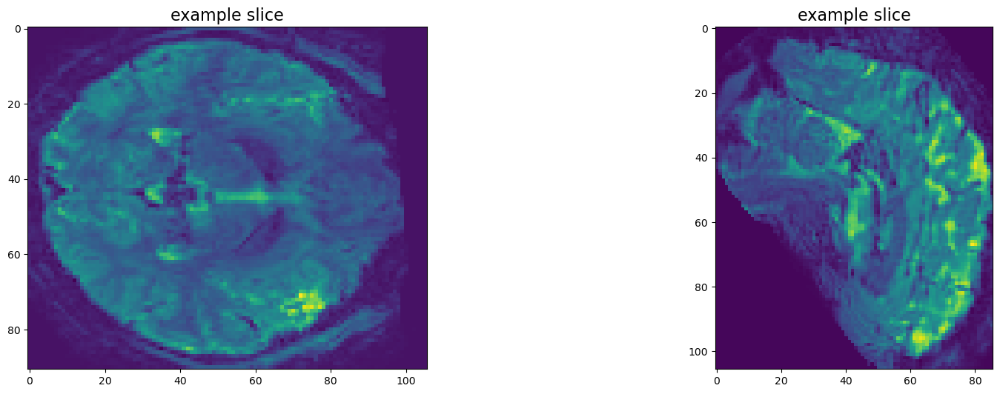

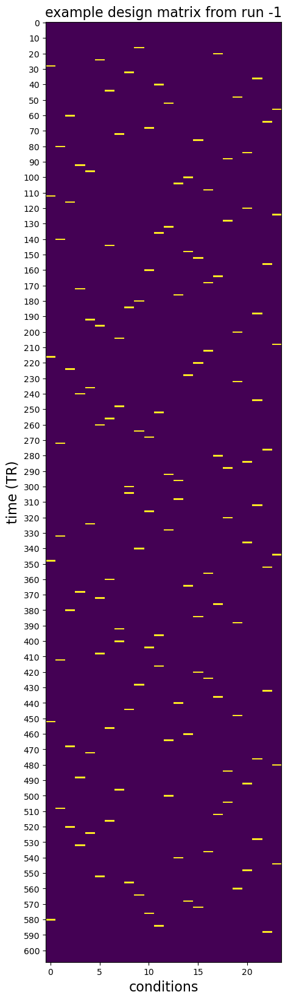

In [6]:
# plot example slice from run 5
plt.figure(figsize=(20,6))
plt.subplot(121)
plt.imshow(imgs[-1][:,:,43,0])
plt.title('example slice',fontsize=16)
plt.subplot(122)
plt.imshow(imgs[-1][45,:,:,0])
plt.title('example slice',fontsize=16)

# plot example design matrix from run 5
plt.figure(figsize=(5,20))
ax = plt.gca()
plt.title('example design matrix from run -1',fontsize=16)
plt.xlabel('conditions',fontsize=16)
plt.ylabel('time (TR)',fontsize=16)
yticks = [*range(0,dm.shape[0], 10)]
ax.set_yticks(yticks)
plt.imshow(dms[-1], interpolation='none', aspect='auto');


# plt.figure(figsize=(20,20))
# plt.imshow(dm)

## Do GLMsingle

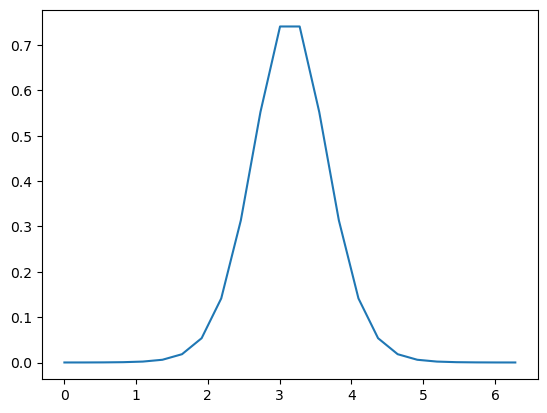

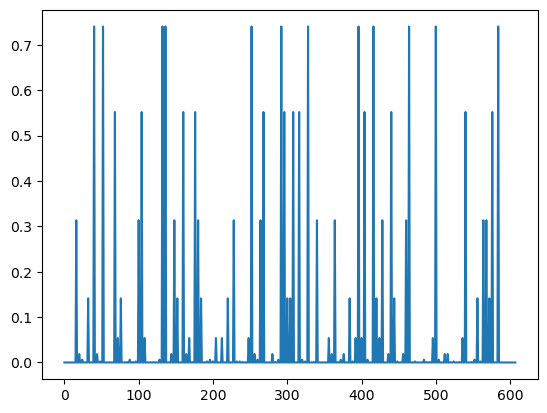

In [7]:
dms[-1].shape
polar_range = np.linspace(0,2*np.pi,dms[-1].shape[-1])
from scipy import stats
prf = stats.vonmises.pdf(polar_range, loc=np.pi, kappa=4)
plt.plot(polar_range, prf)
plt.figure()
plt.plot(np.dot(dms[-1], prf))

In [8]:
opt = dict()

# set important fields for completeness (but these would be enabled by default)
opt['wantlibrary'] = 1
opt['wantglmdenoise'] = 1
opt['wantfracridge'] = 1

# for the purpose of this example we will keep the relevant outputs in memory
# and also save them to the disk
opt['wantfileoutputs'] = [1,1,1,1]
opt['wantmemoryoutputs'] = [1,1,1,1]
opt['fracs'] = np.array([1.  , 0.95, 0.9 , 0.85, 0.8 , 0.75, 0.7 , 0.65, 0.6 , 0.55, 0.5 ,
       0.45, 0.4 , 0.35, 0.3 , 0.25, 0.2 , 0.15, 0.1 , 0.05, 0.04, 0.03, 0.02, 0.01])
# running python GLMsingle involves creating a GLM_single object
# and then running the procedure using the .fit() routine
glmsingle_obj = GLM_single(opt)

# visualize all the hyperparameters
pprint(glmsingle_obj.params)

{'R2thresh': 0,
 'brainR2': [],
 'brainexclude': False,
 'brainthresh': [99.0, 0.1],
 'chunklen': 50000,
 'extra_regressors': False,
 'fracs': array([1.  , 0.95, 0.9 , 0.85, 0.8 , 0.75, 0.7 , 0.65, 0.6 , 0.55, 0.5 ,
       0.45, 0.4 , 0.35, 0.3 , 0.25, 0.2 , 0.15, 0.1 , 0.05, 0.04, 0.03,
       0.02, 0.01]),
 'hrffitmask': 1,
 'hrfmodel': 'optimise',
 'hrfthresh': 0.5,
 'lambda': 0,
 'n_boots': 100,
 'n_jobs': 1,
 'n_pcs': 10,
 'numforhrf': 50,
 'pcR2cutoff': [],
 'pcR2cutoffmask': 1,
 'pcstop': 1.05,
 'seed': 1699652625.2262034,
 'suppressoutput': 0,
 'wantautoscale': 1,
 'wantfileoutputs': [1, 1, 1, 1],
 'wantfracridge': 1,
 'wantglmdenoise': 1,
 'wanthdf5': 0,
 'wantlibrary': 1,
 'wantlss': 0,
 'wantmemoryoutputs': [1, 1, 1, 1],
 'wantparametric': 0,
 'wantpercentbold': 1}


In [9]:
start_time = time.time()

if not exists(outputdir):

    print(f'running GLMsingle...')
    results_glmsingle = glmsingle_obj.fit(
           dms,
           imgs,
           stim_dur,
           pseudo_TR,
           outputdir=str(outputdir),
           figuredir=str(figuredir),
    )
else:
    print(f'loading existing GLMsingle outputs from directory:\n\t{outputdir}')
    
    # load existing file outputs if they exist
    results_glmsingle = dict()
    results_glmsingle['typea'] = np.load(join(outputdir,'TYPEA_ONOFF.npy'),allow_pickle=True).item()
    results_glmsingle['typeb'] = np.load(join(outputdir,'TYPEB_FITHRF.npy'),allow_pickle=True).item()
    results_glmsingle['typec'] = np.load(join(outputdir,'TYPEC_FITHRF_GLMDENOISE.npy'),allow_pickle=True).item()
    results_glmsingle['typed'] = np.load(join(outputdir,'TYPED_FITHRF_GLMDENOISE_RR.npy'),allow_pickle=True).item()

elapsed_time = time.time() - start_time

print(
    '\telapsed time: ',
    f'{time.strftime("%H:%M:%S", time.gmtime(elapsed_time))}'
)

loading existing GLMsingle outputs from directory:
	/tank/shared/2023/dist_supp_pRF/pilot_data/derivatives/GLMsingle_test/GLMsingle_2runs
	elapsed time:  00:00:14


## Plot the results

In [10]:
# we are going to plot several outputs from the FIT_HRF_GLMdenoise_RR GLM,
# which contains the full set of GLMsingle optimizations.

# we will plot betas, R2, optimal HRF indices, and the voxel frac values
plot_fields = ['betasmd','R2','HRFindex','FRACvalue']
colormaps = ['RdBu_r','hot','jet','copper']
clims = [[-5,5],[0,85],[0,20],[0,1]]
xyz = imgs[0].shape[:3]


In [11]:
bm_image_fn = fmriprep_layout.get(subject=sub, 
                                  session=ses, 
                                  task='ping', 
                                  run=run, 
                                  space='T1w',
                                  suffix="mask",
                                  extension='nii.gz')[0]
bg_image_fn = fmriprep_layout.get(subject=sub, 
                                  session=ses, 
                                  task='ping', 
                                  run=run, 
                                  space='T1w',
                                  suffix="boldref",
                                  extension='nii.gz')[0]
print(bm_image_fn.path)
bmask = nib.load(bm_image_fn).get_fdata().astype(bool)

/tank/shared/2023/dist_supp_pRF/pilot_data/derivatives/fmriprep/sub-001/ses-01/func/sub-001_ses-01_task-ping_run-5_space-T1w_desc-brain_mask.nii.gz


### TYPEA_ONOFF R2

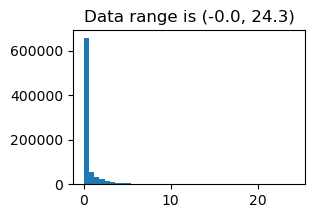


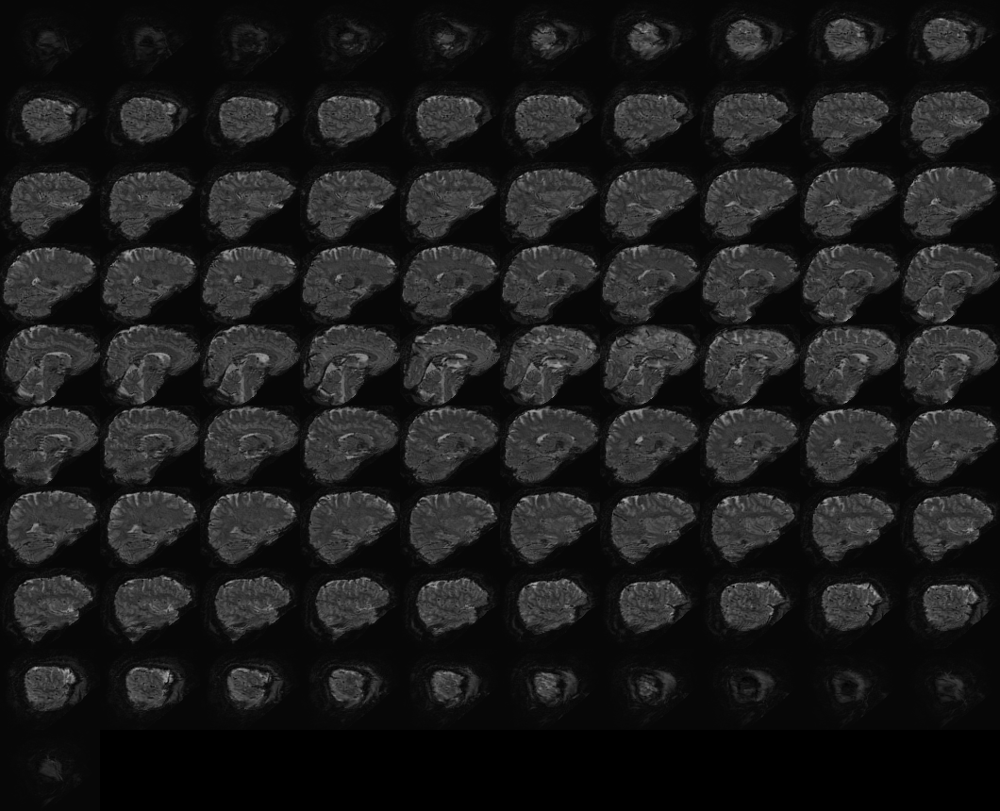
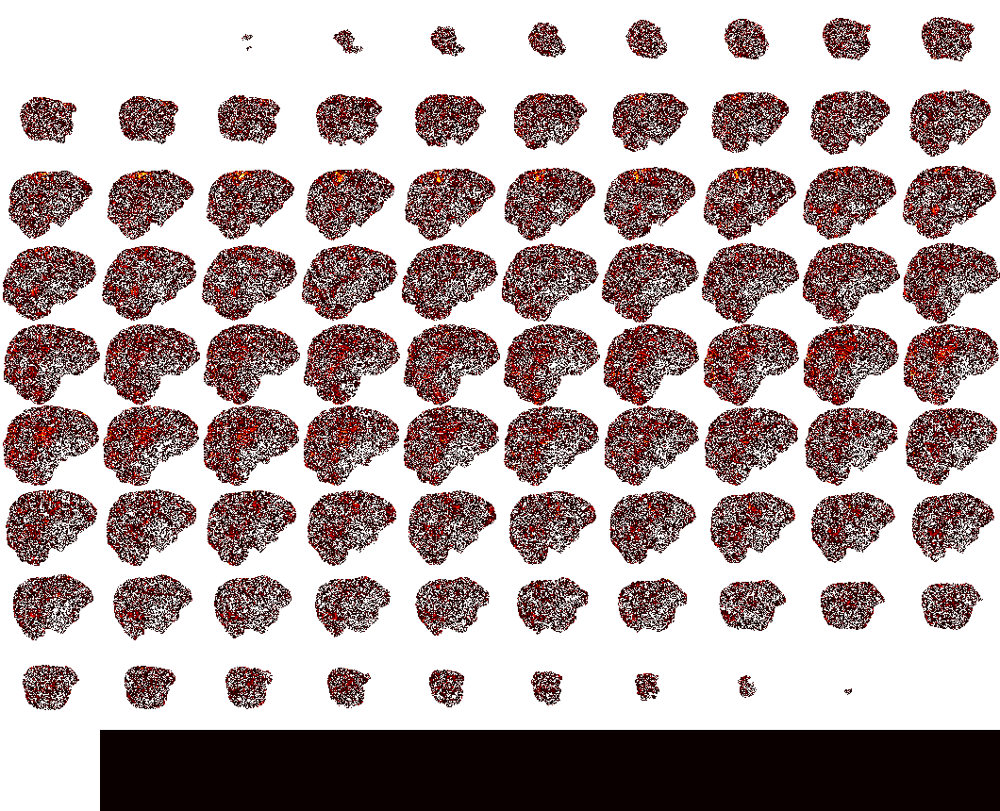

In [12]:
R2_ONOFF_masked = np.zeros_like(results_glmsingle['typea']['onoffR2'])
R2_ONOFF_masked[bmask] = results_glmsingle['typea']['onoffR2'][bmask]

R2_ONOFF_masked_flatten = R2_ONOFF_masked.copy()
R2_ONOFF_masked_flatten = R2_ONOFF_masked.flatten()

plt.figure(figsize=(3,2))
axes = plt.gca()
plt.hist(R2_ONOFF_masked.flatten(), 
         bins=40, 
         # range=(R2_ONOFF_masked_flatten[abs(R2_ONOFF_masked_flatten - np.nanmean(R2_ONOFF_masked_flatten)) < 2.58 * np.nanstd(R2_ONOFF_masked_flatten)].min(), 
         #        R2_ONOFF_masked_flatten[abs(R2_ONOFF_masked_flatten - np.nanmean(R2_ONOFF_masked_flatten)) < 2.58 * np.nanstd(R2_ONOFF_masked_flatten)].max())
        )
plt.title('Data range is ({:.1f}, {:.1f})'.format(np.nanmin(R2_ONOFF_masked_flatten), np.nanmax(R2_ONOFF_masked_flatten)))
plt.show() 

view_img(nib.Nifti1Image(R2_ONOFF_masked, 
                         affine=datvol.affine, 
                         header=datvol.header, 
                         ),
         threshold="70%", 
         vmin=0, 
         vmax=22, 
         cmap='hot', 
         symmetric_cmap=False, 
         bg_img=bg_image_fn,)

### TYPED Betas

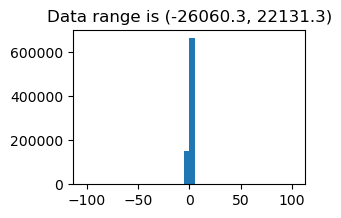

In [13]:
betasmd_mean = np.nanmean(results_glmsingle['typed']['betasmd'], axis=3)
betasmd_masked = np.zeros_like(betasmd_mean)
betasmd_masked[bmask] = betasmd_mean[bmask]

plt.figure(figsize=(3,2))
axes = plt.gca()
plt.hist(betasmd_masked.flatten(), 
         bins=40, 
         range=(np.nanmin(betasmd_masked[abs(betasmd_masked - np.nanmean(betasmd_masked)) < 2.58 * np.nanstd(betasmd_masked)].flatten()), 
                np.nanmax(betasmd_masked[abs(betasmd_masked - np.nanmean(betasmd_masked)) < 2.58 * np.nanstd(betasmd_masked)].flatten()))
        )
plt.title('Data range is ({:.1f}, {:.1f})'.format(np.nanmin(betasmd_masked.flatten()), np.nanmax(betasmd_masked.flatten())))
plt.show() 


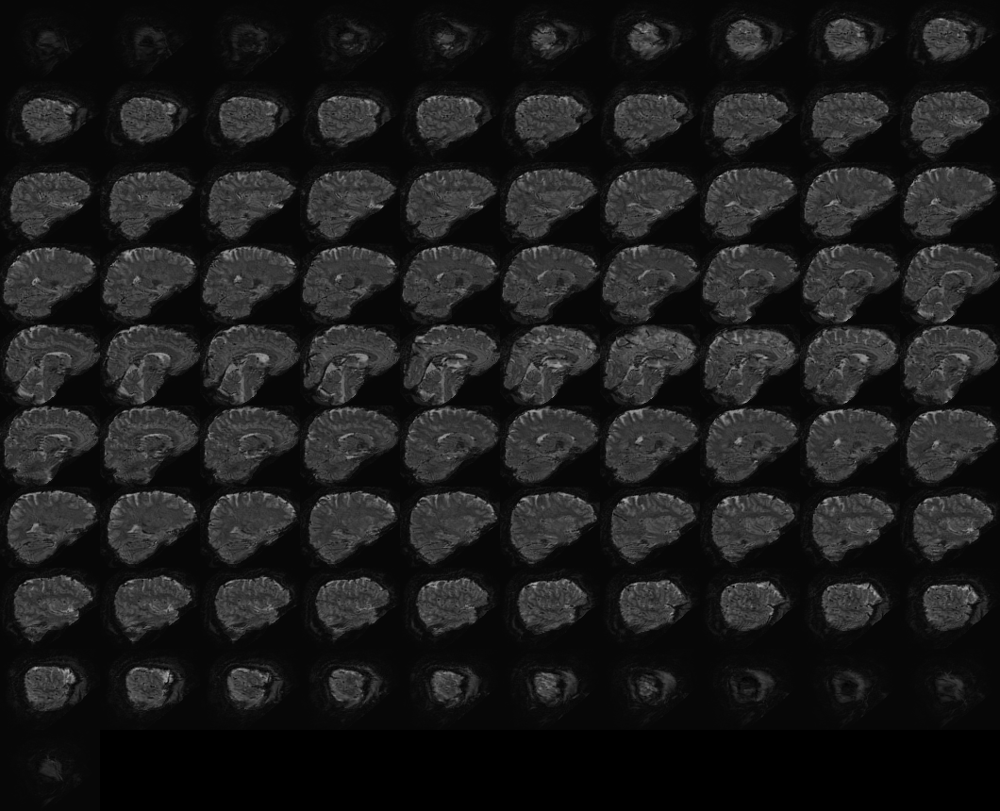
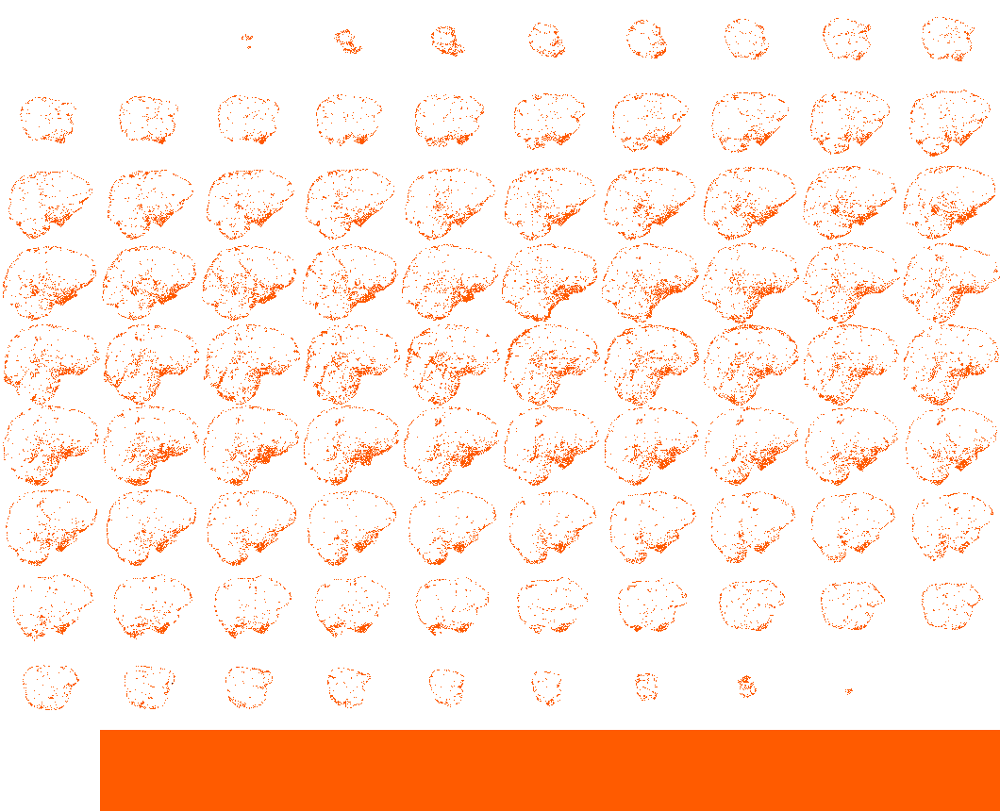

In [14]:
view_img(nib.Nifti1Image(betasmd_masked, 
                         affine=datvol.affine, 
                         header=datvol.header, 
                         ),
         threshold="95%", 
        #  vmin=100, 
        #  vmax=84444, 
         cmap='hot', 
         symmetric_cmap=False, 
         bg_img=bg_image_fn,)

### TYPED R2

In [15]:
R2_masked = np.zeros_like(results_glmsingle['typed']['R2'])
R2_masked[bmask] = results_glmsingle['typed']['R2'][bmask]
R2_masked_flatten = R2_masked.copy()

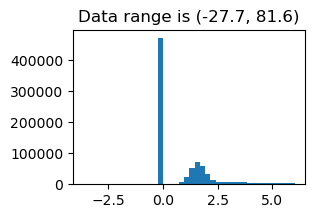

In [16]:
R2_masked_flatten = R2_masked.copy()
R2_masked_flatten = R2_masked.flatten()

plt.figure(figsize=(3,2))
axes = plt.gca()
plt.hist(R2_masked.flatten(), 
         bins=40, 
         range=(R2_masked_flatten[abs(R2_masked_flatten - np.nanmean(R2_masked_flatten)) < 2.58 * np.nanstd(R2_masked_flatten)].min(), 
                R2_masked_flatten[abs(R2_masked_flatten - np.nanmean(R2_masked_flatten)) < 2.58 * np.nanstd(R2_masked_flatten)].max())
        )
plt.title('Data range is ({:.1f}, {:.1f})'.format(np.nanmin(R2_masked_flatten), np.nanmax(R2_masked_flatten)))
plt.show()

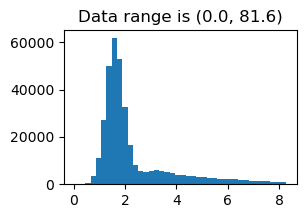

In [17]:
thres_R2 = 0

R2_masked_thres = R2_masked.copy()
R2_masked_thres[abs(R2_masked)<=thres_R2] = np.nan
R2_masked_thres[R2_masked<=0] = np.nan
R2_masked_flatten = R2_masked_thres.flatten()

plt.figure(figsize=(3,2))
axes = plt.gca()
plt.hist(R2_masked.flatten(), 
         bins=40, 
         range=(R2_masked_flatten[abs(R2_masked_flatten - np.nanmean(R2_masked_flatten)) < 2.58 * np.nanstd(R2_masked_flatten)].min(), 
                R2_masked_flatten[abs(R2_masked_flatten - np.nanmean(R2_masked_flatten)) < 2.58 * np.nanstd(R2_masked_flatten)].max())
        )
plt.title('Data range is ({:.1f}, {:.1f})'.format(np.nanmin(R2_masked_thres), np.nanmax(R2_masked_thres)))
plt.show()


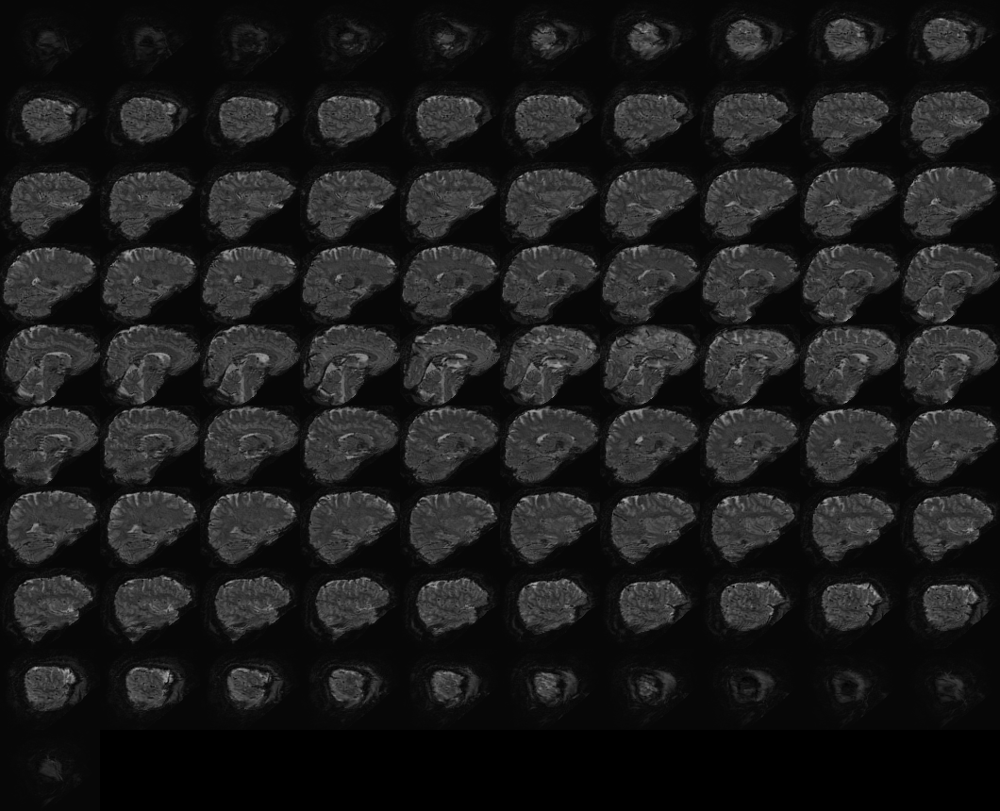
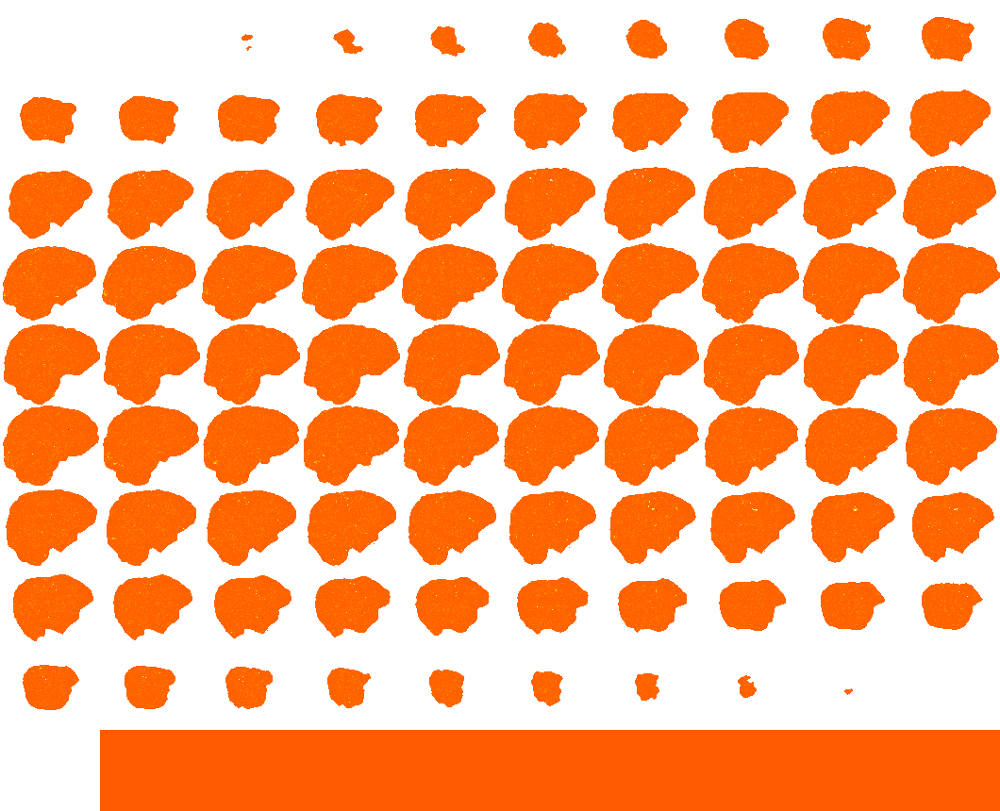

In [18]:
view_img(nib.Nifti1Image(R2_masked, 
                         affine=datvol.affine, 
                         header=datvol.header, 
                         ),
         # threshold="99%", 
         vmin=0, 
         vmax=70, 
         cmap='hot', 
         symmetric_cmap=False, 
         bg_img=bg_image_fn,)

(array([3.56125e+05, 4.00000e+01, 1.00000e+00, 0.00000e+00, 0.00000e+00,
        1.40000e+01, 6.60000e+01, 1.45000e+02, 1.27000e+02, 1.10800e+03]),
 array([0.01      , 0.109     , 0.208     , 0.30700001, 0.40599999,
        0.505     , 0.60399997, 0.70300001, 0.80199999, 0.90100002,
        1.        ]),
 <BarContainer object of 10 artists>)

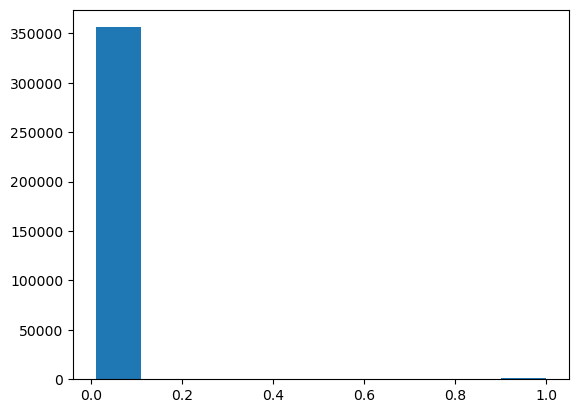

In [19]:
plt.hist(results_glmsingle['typed']['FRACvalue'][bmask])

In [20]:
results_glmsingle['typed'].keys()

dict_keys(['HRFindex', 'HRFindexrun', 'glmbadness', 'pcvoxels', 'pcnum', 'xvaltrend', 'noisepool', 'pcregressors', 'betasmd', 'R2', 'R2run', 'rrbadness', 'FRACvalue', 'scaleoffset', 'meanvol'])

### Fractal


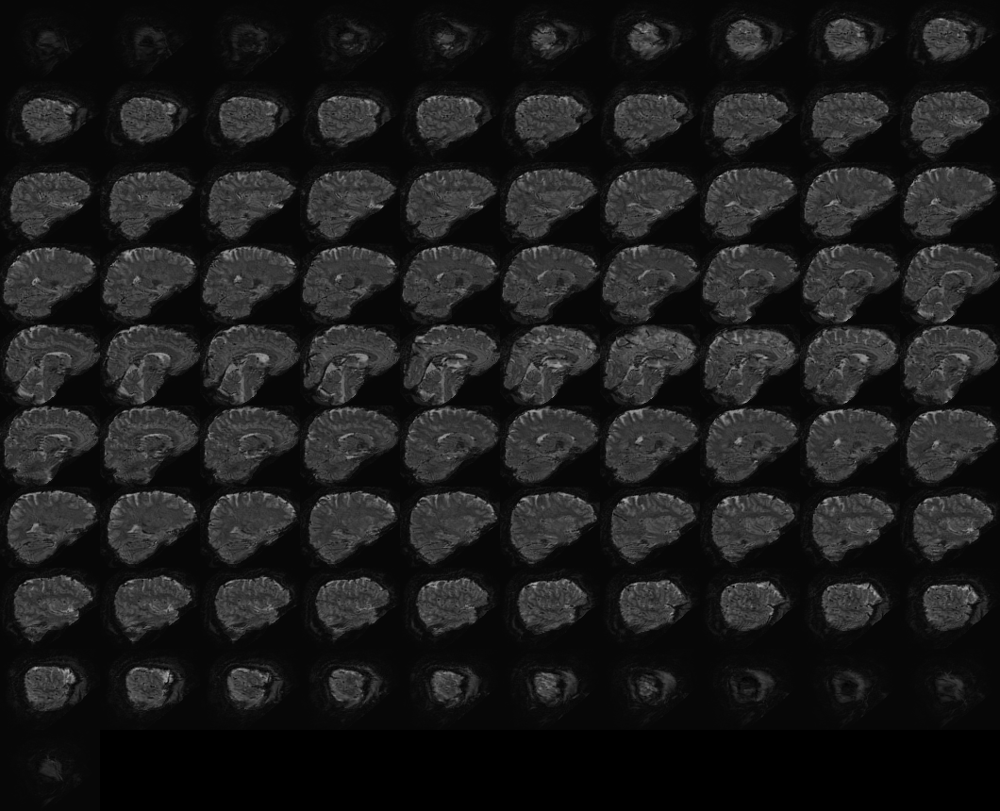
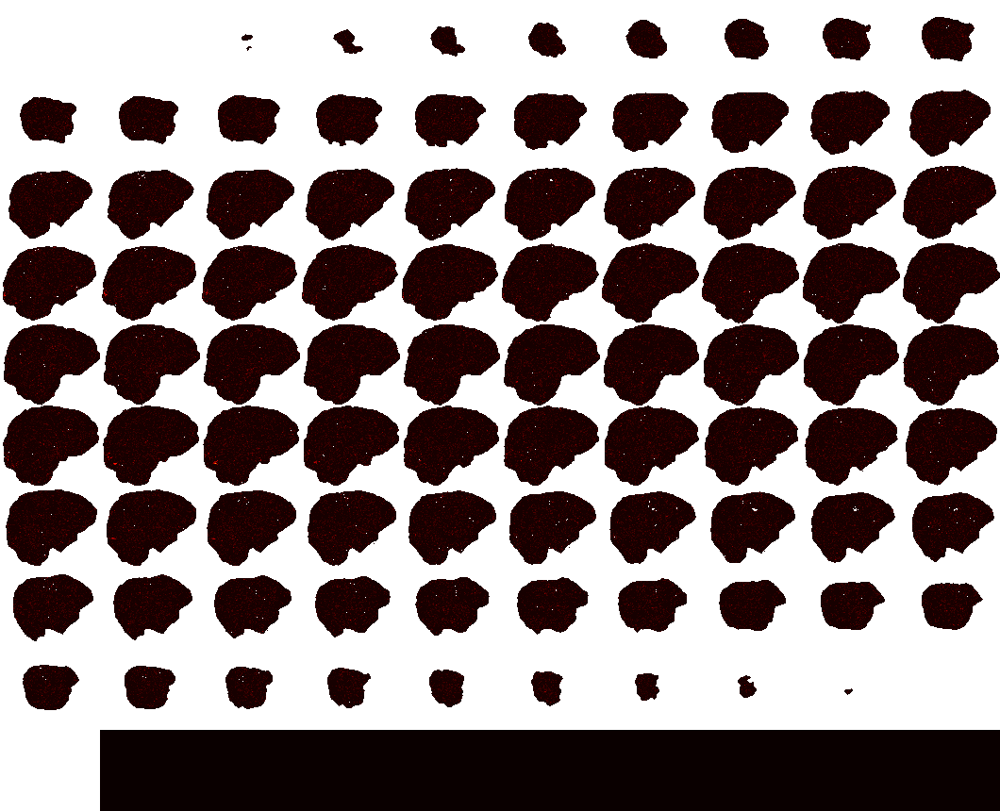

In [21]:
FRACvalue_masked = np.zeros_like(results_glmsingle['typed']['FRACvalue'])
FRACvalue_masked[bmask] = results_glmsingle['typed']['FRACvalue'][bmask]
FRACvalue_masked_thres = FRACvalue_masked.copy()
FRACvalue_masked_thres[FRACvalue_masked<0.05] = np.nan

view_img(nib.Nifti1Image(FRACvalue_masked, 
                         affine=datvol.affine, 
                         header=datvol.header, 
                         ),
         # threshold="99%", 
         vmin=0, 
         vmax=0.5, 
         cmap='hot', 
         symmetric_cmap=False, 
         bg_img=bg_image_fn,)

In [22]:
FRACvalue_masked.shape

(91, 106, 86)

In [23]:
FRACvalue_masked[32,27,-16]

0.01

### TYPEC R2

In [24]:
R2_typec_masked = np.zeros_like(results_glmsingle['typec']['R2'])
R2_typec_masked[bmask] = results_glmsingle['typec']['R2'][bmask]
R2_typec_masked_flatten = R2_typec_masked.copy()

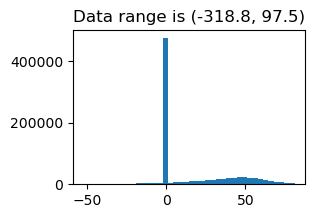

In [25]:
R2_typec_masked_flatten = R2_typec_masked.copy()
R2_typec_masked_flatten = R2_typec_masked.flatten()

plt.figure(figsize=(3,2))
axes = plt.gca()
plt.hist(R2_typec_masked.flatten(), 
         bins=40, 
         range=(R2_typec_masked_flatten[abs(R2_typec_masked_flatten - np.nanmean(R2_typec_masked_flatten)) < 2.58 * np.nanstd(R2_typec_masked_flatten)].min(), 
                R2_typec_masked_flatten[abs(R2_typec_masked_flatten - np.nanmean(R2_typec_masked_flatten)) < 2.58 * np.nanstd(R2_typec_masked_flatten)].max())
        )
plt.title('Data range is ({:.1f}, {:.1f})'.format(np.nanmin(R2_typec_masked_flatten), np.nanmax(R2_typec_masked_flatten)))
plt.show() 

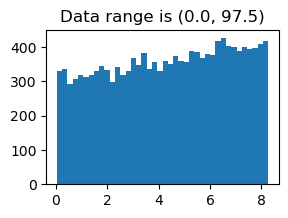

In [26]:
thres_R2_typec = 0

R2_typec_masked_thres = R2_typec_masked.copy()
R2_typec_masked_thres[abs(R2_typec_masked)<=thres_R2] = np.nan
R2_typec_masked_thres[R2_typec_masked<=0] = np.nan
R2_typec_masked_flatten = R2_typec_masked_thres.flatten()

plt.figure(figsize=(3,2))
axes = plt.gca()
plt.hist(R2_typec_masked.flatten(), 
         bins=40, 
         range=(R2_masked_flatten[abs(R2_masked_flatten - np.nanmean(R2_masked_flatten)) < 2.58 * np.nanstd(R2_masked_flatten)].min(), 
                R2_masked_flatten[abs(R2_masked_flatten - np.nanmean(R2_masked_flatten)) < 2.58 * np.nanstd(R2_masked_flatten)].max())
        )
plt.title('Data range is ({:.1f}, {:.1f})'.format(np.nanmin(R2_typec_masked_thres), np.nanmax(R2_typec_masked_thres)))
plt.show()


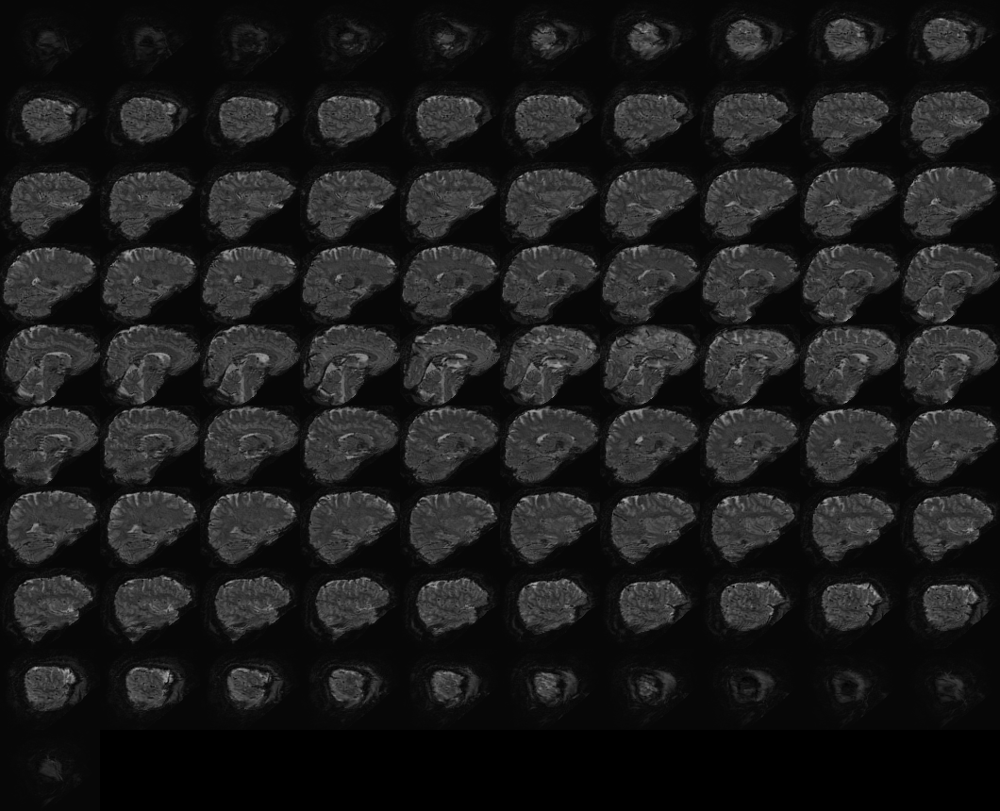
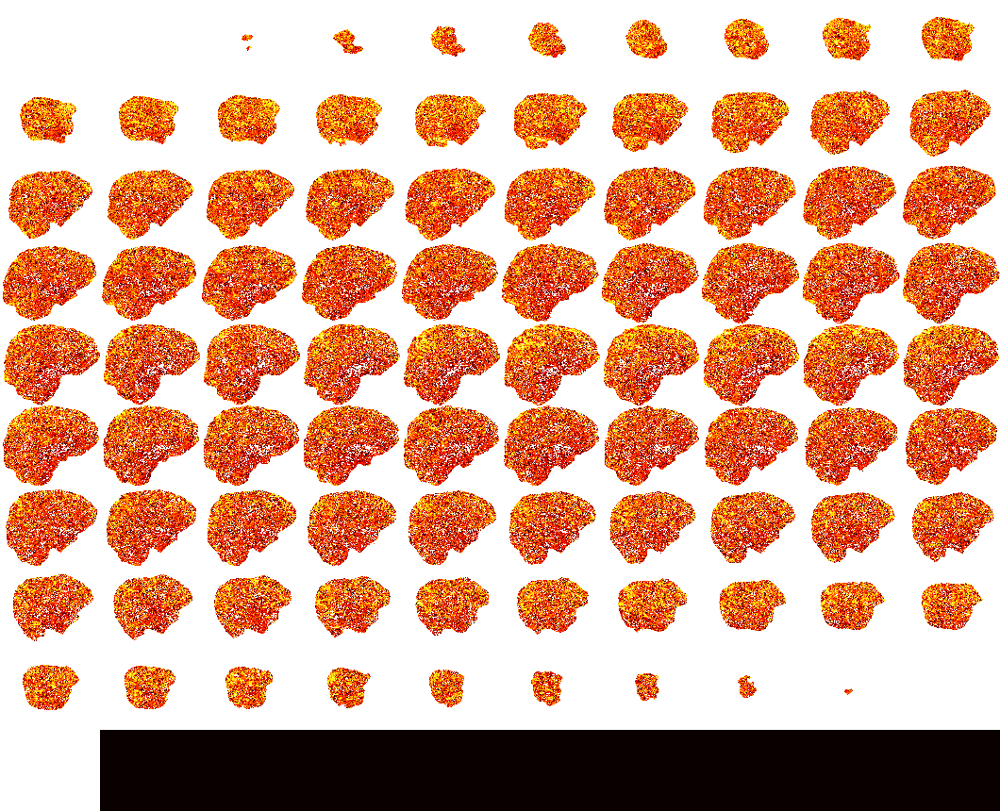

In [27]:
view_img(nib.Nifti1Image(R2_typec_masked_thres, 
                         affine=datvol.affine, 
                         header=datvol.header, 
                         ),
         # threshold="99%", 
         # vmin=0, 
         # vmax=1, 
         cmap='hot', 
         symmetric_cmap=False, 
         bg_img=bg_image_fn,)

## polar angle beta map

In [28]:
stim_con_dms = np.concatenate(stim_dms)

In [29]:
def solve_offset(betas, dm_theta):
    # beta = a * cos(theta) * cos(offset) - a * sin(theta) * sin(offset) + b
    tanx_offset, _, _, _ = np.linalg.lstsq(dm_theta.T, betas)
    offset = math.degrees(math.atan2(tanx_offset[1], tanx_offset[0]))
    return offset


def create_offsetdm(degrees):
    radi = np.zeros((1,len(degrees)))
    dm_theta = np.zeros((2,len(degrees)))
    for count, degree in enumerate(degrees):
        radi[0, count]     = math.radians(degree)
        dm_theta[0, count] = math.cos(radi[0,count])
        dm_theta[1, count] = math.sin(radi[0,count])
    return dm_theta


def cal_vertex_deg(betamap_all, unique_event_types):
    offset = np.zeros((1,betamap_all.shape[1]))
    for voxel_ind in range(betamap_all.shape[1]):
        betas          = betamap_all[:,voxel_ind]
        dm_theta       = create_offsetdm(unique_event_types)
        offset[0, voxel_ind] = solve_offset(betas, dm_theta)
    offset %= 360 
    return offset

### TYPEC

In [30]:
betas_typec = results_glmsingle['typec']['betasmd']
betamap_typec_all = np.zeros((len(angles), np.prod(betas_typec.shape[0:3])))
nan_typec_mask = np.isnan(np.mean(betas_typec, axis=3))

for ind, angle in enumerate(angles):
    betamap_typec_all[ind, :] = np.nanmean(betas_typec[:, :, :, stim_con_dms==angle], axis=3).flatten()

betas_typec_all_trials = np.zeros((betas_typec.shape[-1], np.prod(betas_typec.shape[0:3])))
for ind in range(betas_typec.shape[-1]):
    betas_typec_all_trials[ind, :] = np.nan_to_num(betas_typec[:, :, :, ind].flatten())
    
betamap_typec_all = np.nan_to_num(betamap_typec_all)
# offset_typec = cal_vertex_deg(betamap_typec_all, angles)
offset_typec = cal_vertex_deg(betas_typec_all_trials, stim_con_dms)
print(offset_typec.max(), offset_typec.min())

359.9997312975076 0.0


In [31]:
offset_typec_thres = offset_typec.reshape(R2_masked.shape).copy()

offset_typec_thres_masked = np.empty_like(offset_typec_thres)
offset_typec_thres_masked[:] = np.nan
offset_typec_thres_masked[bmask] = offset_typec_thres[bmask]

# offset_typec_thres_masked[results_glmsingle['typec']['R2']<35] = np.nan
print(np.nanmax(offset_typec_thres_masked), np.nanmin(offset_typec_thres_masked))

359.9997312975076 0.0



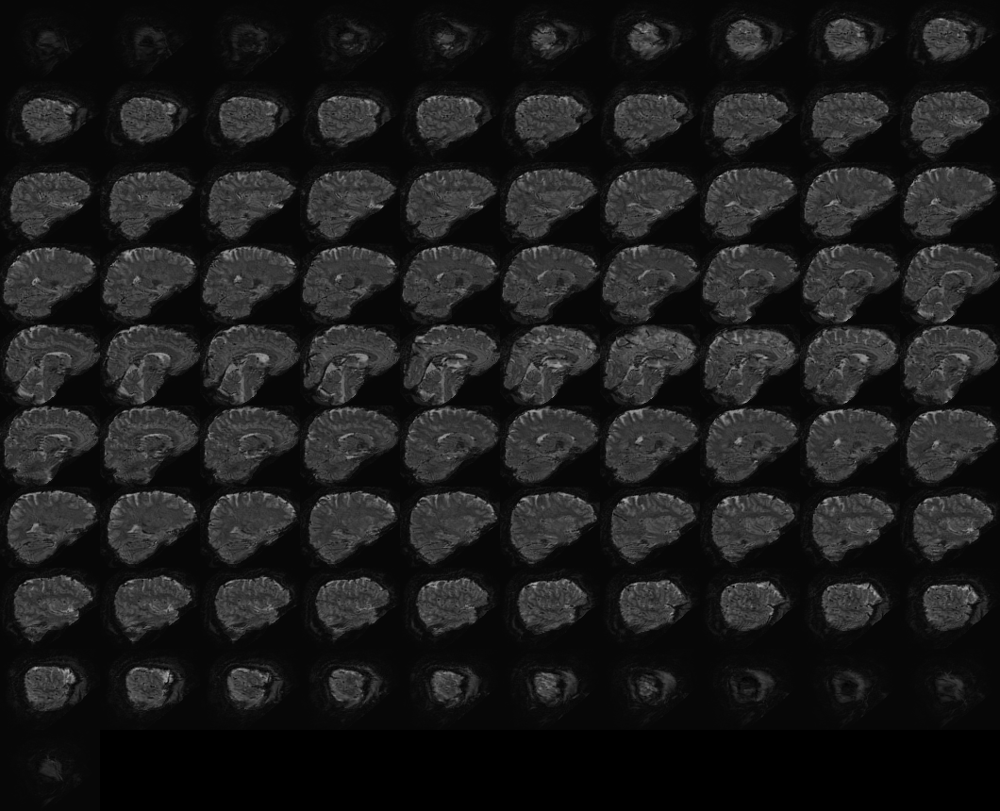
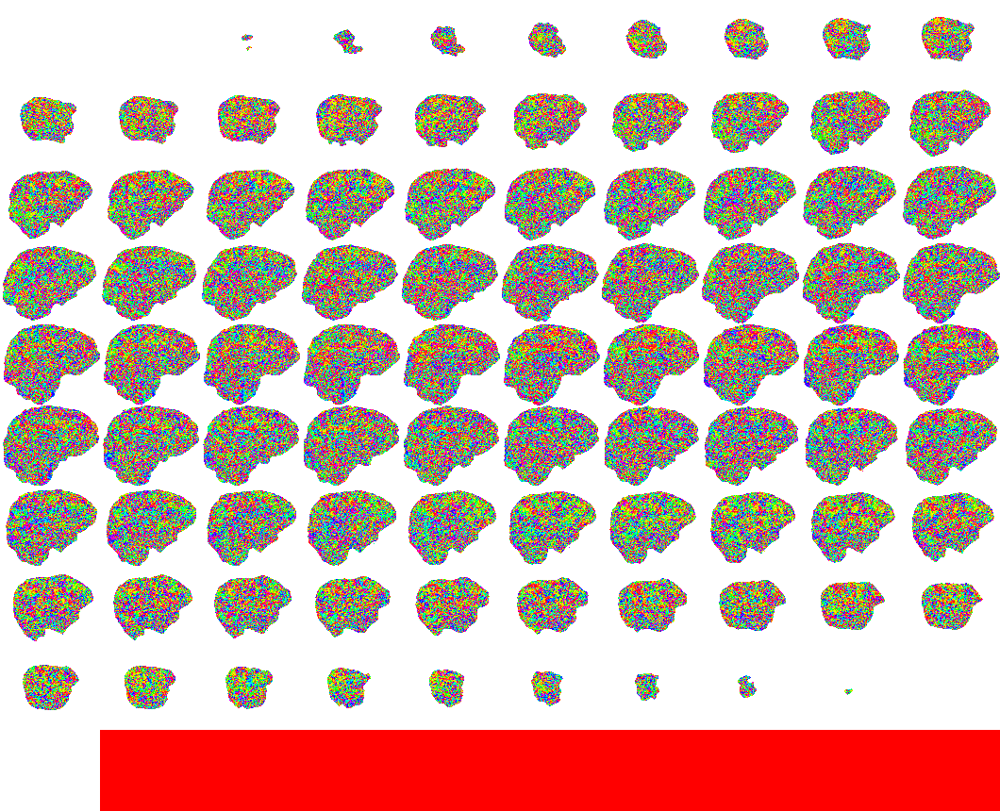

In [32]:
view_img(nib.Nifti1Image(offset_typec_thres_masked, 
                         affine=datvol.affine, 
                         header=datvol.header, 
                         ),
         # threshold="99%", 
         vmin=0, 
         vmax=360, 
         cmap='hsv', 
         symmetric_cmap=False, 
         bg_img=bg_image_fn,)

### TYPED

In [33]:
betas_typed = results_glmsingle['typed']['betasmd']
betamap_typed_all = np.zeros((len(angles), np.prod(betas_typed.shape[0:3])))
nan_typec_mask = np.isnan(np.mean(betas_typed, axis=3))

for ind, angle in enumerate(angles):
    betamap_typed_all[ind, :] = np.nanmean(betas_typed[:, :, :, stim_con_dms==angle], axis=3).flatten()

betas_typed_all_trials = np.zeros((betas_typed.shape[-1], np.prod(betas_typed.shape[0:3])))
for ind in range(betas_typed.shape[-1]):
    betas_typed_all_trials[ind, :] = np.nan_to_num(betas_typed[:, :, :, ind].flatten())
    
betamap_typed_all = np.nan_to_num(betamap_typed_all)
# offset_typec = cal_vertex_deg(betamap_typec_all, angles)
offset_typed = cal_vertex_deg(betas_typed_all_trials, stim_con_dms)
print(offset_typed.max(), offset_typed.min())

359.9997550607969 0.0


In [34]:
offset_typed_thres = offset_typed.reshape(R2_masked.shape).copy()

offset_typed_thres_masked = np.empty_like(offset_typed_thres)
offset_typed_thres_masked[:] = np.nan
offset_typed_thres_masked[bmask] = offset_typed_thres[bmask]

# offset_typed_thres_masked[results_glmsingle['typed']['R2']<35] = np.nan
print(np.nanmax(offset_typed_thres_masked), np.nanmin(offset_typed_thres_masked))

359.9997550607969 0.0



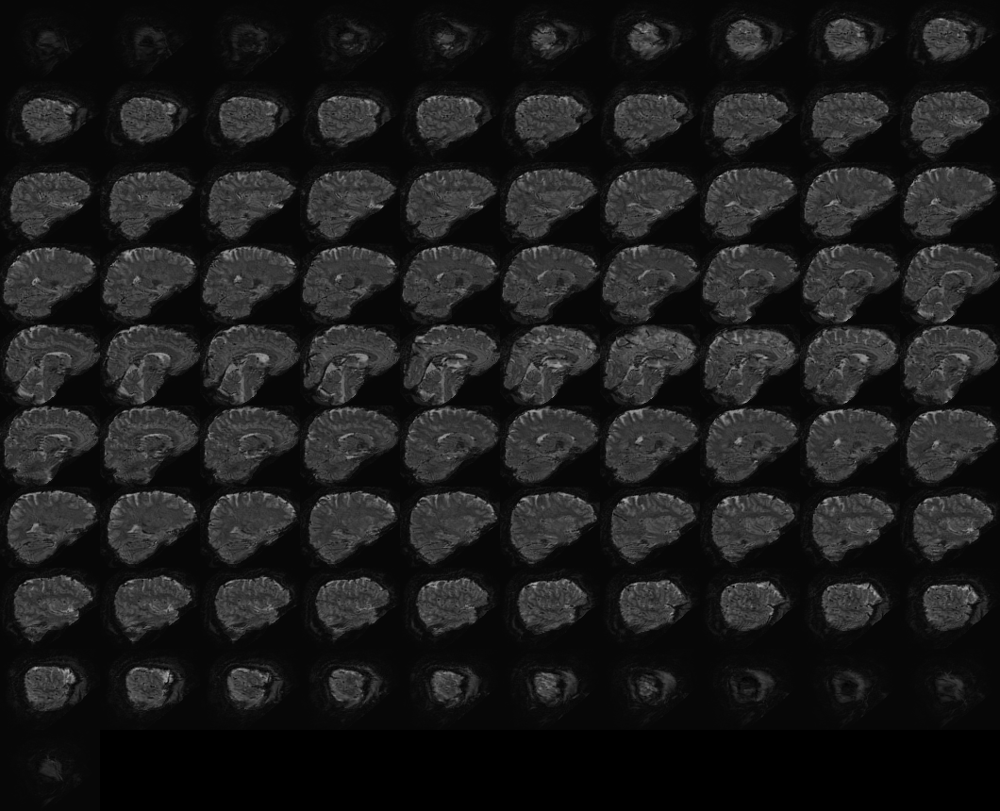
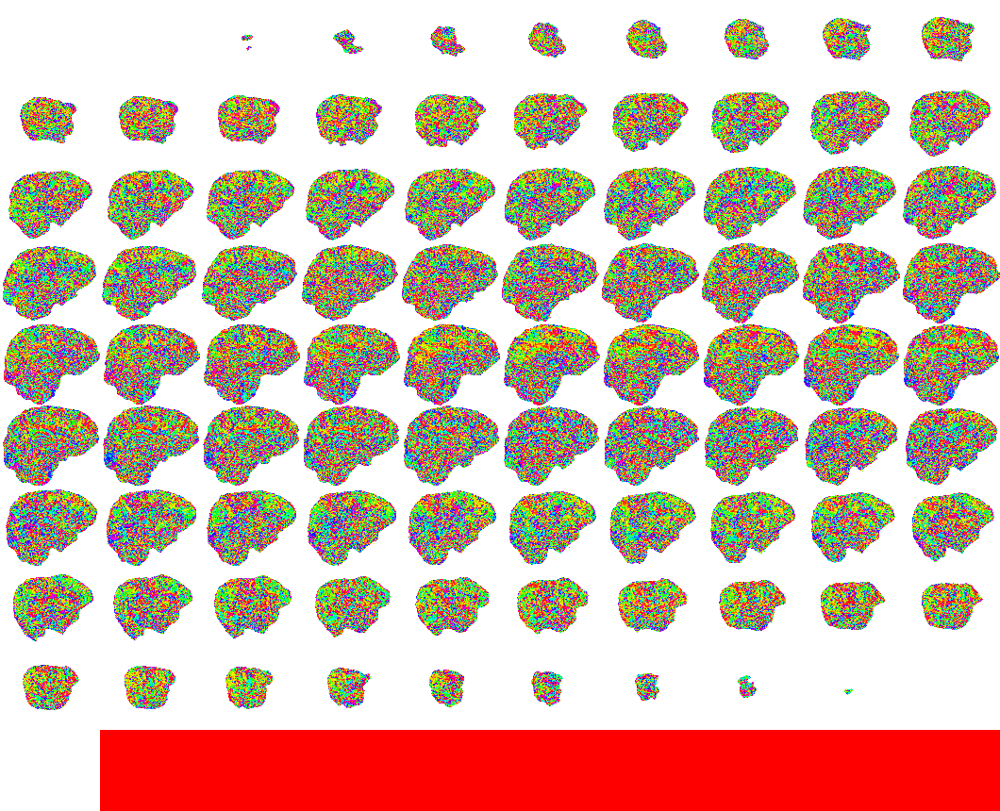

In [35]:
view_img(nib.Nifti1Image(offset_typed_thres_masked, 
                         affine=datvol.affine, 
                         header=datvol.header, 
                         ),
         # threshold="99%", 
         vmin=0, 
         vmax=360, 
         cmap='hsv', 
         symmetric_cmap=False, 
         bg_img=bg_image_fn,)